# Import all packages

In [1]:
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
using Turing
using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using OrdinaryDiffEq
Random.seed!(145975);
using CmdStan
using KernelDensity
using LaTeXStrings
using StatsBase
using JLD2

set_cmdstan_home!("C:\\cmdstan\\cmdstan-2.30.0");

┌ Warning: Environment variable CMDSTAN_HOME not set. Use set_cmdstan_home!.
└ @ CmdStan C:\Users\dgomez\.julia\packages\CmdStan\2vwWj\src\CmdStan.jl:27


In [2]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\FunctionsBayesInfs.jl")

restructDatInfCompRep_RealExpDat_FixScF (generic function with 1 method)

# Extract Data in Stan Format

In [3]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\";
paths = [mainpath*"2Mil_Dat.csv", mainpath*"4Mil_Dat.csv", mainpath*"8Mil_Dat.csv"]

3-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 26 bytes ⋯ "ence\\ProcessedData\\2Mil_Dat.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 26 bytes ⋯ "ence\\ProcessedData\\4Mil_Dat.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 26 bytes ⋯ "ence\\ProcessedData\\8Mil_Dat.csv"

In [4]:
dat = restructDatInf(paths)

Dict{String, Any} with 14 entries:
  "Means"  => [7719.3 7114.49 7078.58; 5784.22 5374.68 4974.61; … ; -0.332078 -…
  "stsl"   => [78 78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0 0; 15 15 15; … ; 390 390 390; 395 395 395]
  "obser"  => 2
  "Y0us"   => [7719.3 7114.49 7078.58; 0.0 0.0 0.0; 0.0 0.0 0.0]
  "ts"     => [1.0e-20 1.0e-20 1.0e-20; 1.0 1.0 1.0; … ; 394.0 394.0 394.0; 395…
  "itp"    => [0.0, 0.0, 0.0]
  "ncells" => [2 4 8]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [919.986 706.515 1071.38; 720.006 455.928 835.636; … ; 4.13944 3.…
  "m"      => 3
  "nts"    => [395 395 395]

# Bayesian Inference

In [5]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\HP_PyrLac_TransporterModel.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrTransport", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [52]:
rc, chns, cnames = stan(StanModel, dat)#, init = ini) 
# Runs in about 35 min


┌ Error: Input [[0.0 7719.296509612049 919.9861609931926 0.0 1.0; 15.0 5784.216666666667 720.0059559707358 12.2309 1.0; 20.0 5147.596666666666 707.0277274855163 19.0033 2.950600160984203; 25.0 4730.113333333334 545.022855881598 24.877799999999997 4.364157019402487; 30.0 4311.256666666667 483.1880203744018 32.34813333333333 2.462728978863352; 35.0 3923.5 432.41761909061944 34.00096666666666 6.086361065803881; 40.0 3511.1166666666663 402.6069840841479 33.82046666666667 1.5452020267050313; 45.0 3167.4 401.3987153691451 36.84746666666666 4.976552935851614; 50.0 2893.4366666666665 363.0742878989552 42.80056666666667 6.5771589043699805; 55.0 2639.23 327.46095965778875 43.171899999999994 5.727700010475407; 60.0 2380.08 310.5440211950634 41.92536666666666 8.54659111712578; 65.0 2162.57 292.2280321940386 45.42463333333333 11.38445644566895; 70.0 1947.4866666666667 248.42705696709714 39.8516 4.045696770644089; 75.0 1769.9533333333336 252.09119229622715 42.70676666666666 5.236067068261572; 80.0 1

(0, [-3313.44 1.0 … 43.8856 0.000599276; -3313.44 0.0 … 43.8856 0.000599276; … ; -1806.77 0.99209 … 42.8284 0.000338838; -1804.83 0.662071 … 40.729 0.000504112;;; -7717.32 0.666667 … 48.4951 0.000166712; -7717.32 0.0 … 48.4951 0.000166712; … ; -1804.64 0.950566 … 41.9339 0.000398341; -1803.63 0.991945 … 42.1101 0.000420087;;; -7007.89 1.0 … 31.2929 0.00349699; -7007.89 0.0 … 31.2929 0.00349699; … ; -1804.22 0.979016 … 42.923 0.000334698; -1806.93 0.974024 … 43.9753 0.000316151;;; -3562.41 1.0 … 50.1698 0.000292576; -3562.41 0.0 … 50.1698 0.000292576; … ; -1807.32 0.999605 … 40.9564 0.0003557; -1805.89 0.453774 … 41.0749 0.000360402], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "k_f1", "k_r1", "T1_P", "T1_X", "kin", "theta.1", "theta.2", "theta.3", "theta.4", "theta.5"])

In [5]:
using JLD2

In [7]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PyrTranspInferRes.jld", "rc", rc, "chns", chns, "cnames", cnames)

UndefVarError: UndefVarError: `rc` not defined

In [8]:
poster = vcat(chns[1001:end, end-4:end, 1], chns[1001:end, end-4:end, 2], chns[1001:end, end-4:end, 3], chns[1001:end, end-4:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorTransp.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorTransp.csv", DataFrame(poster, :auto))

UndefVarError: UndefVarError: `chns` not defined

In [6]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorTransp.csv", DataFrame))

8000×5 Matrix{Float64}:
 0.0121071   0.00729403  51.4335  40.9982  0.000437063
 0.0116509   0.00723133  51.3631  41.0411  0.00044108
 0.0123224   0.00547302  51.4221  39.987   0.000404548
 0.0126204   0.00534944  51.3858  40.1811  0.000404335
 0.0106319   0.00763115  51.2069  40.5615  0.00048387
 0.0106507   0.00658548  51.1339  40.0669  0.000455157
 0.0105514   0.0064369   51.1157  39.9787  0.000465196
 0.0109566   0.00758906  51.242   41.9763  0.000453411
 0.0117418   0.00738684  51.1486  41.2011  0.000449053
 0.00993475  0.00791581  51.3677  40.5013  0.000500054
 ⋮                                         
 0.0128396   0.00628302  51.1818  41.2065  0.00040296
 0.0118199   0.00576482  51.1894  41.1471  0.000414567
 0.0113666   0.00618741  51.3667  39.7863  0.00043711
 0.0124957   0.00535189  51.1049  41.7513  0.000388978
 0.0133171   0.00604009  51.1365  42.3193  0.000387134
 0.0132059   0.00541543  50.8826  41.7596  0.000385359
 0.0148804   0.00485789  51.3463  41.1598  0.000360335
 

In [6]:
mean(poster, dims = 1)

1×5 Matrix{Float64}:
 0.0117277  0.00639614  51.2374  40.9222  0.000434518

In [9]:
std(poster, dims = 1)

1×5 Matrix{Float64}:
 0.00159807  0.00099118  0.171869  1.07172  4.85176e-5

# Plot Posteriors Against Priors

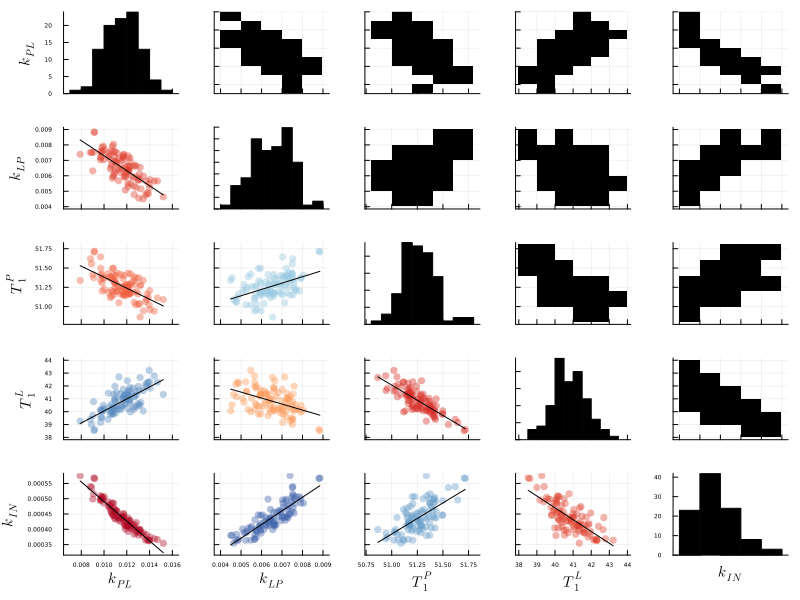

In [7]:
pc = corrplot(poster[1:100,:], label = [L"k_{PL}",L"k_{LP}",L"T_1^P",L"T_1^L",L"k_{IN}"])

fp1 = plot(pc, size=(800,600), xtickfont=font(4), ytickfont=font(4), guidefont=font(10))

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorTransporterCorr.svg")
# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorTransporterCorr.png")

display(fp1)

In [9]:
using CairoMakie
using PairPlots
using DataFrames

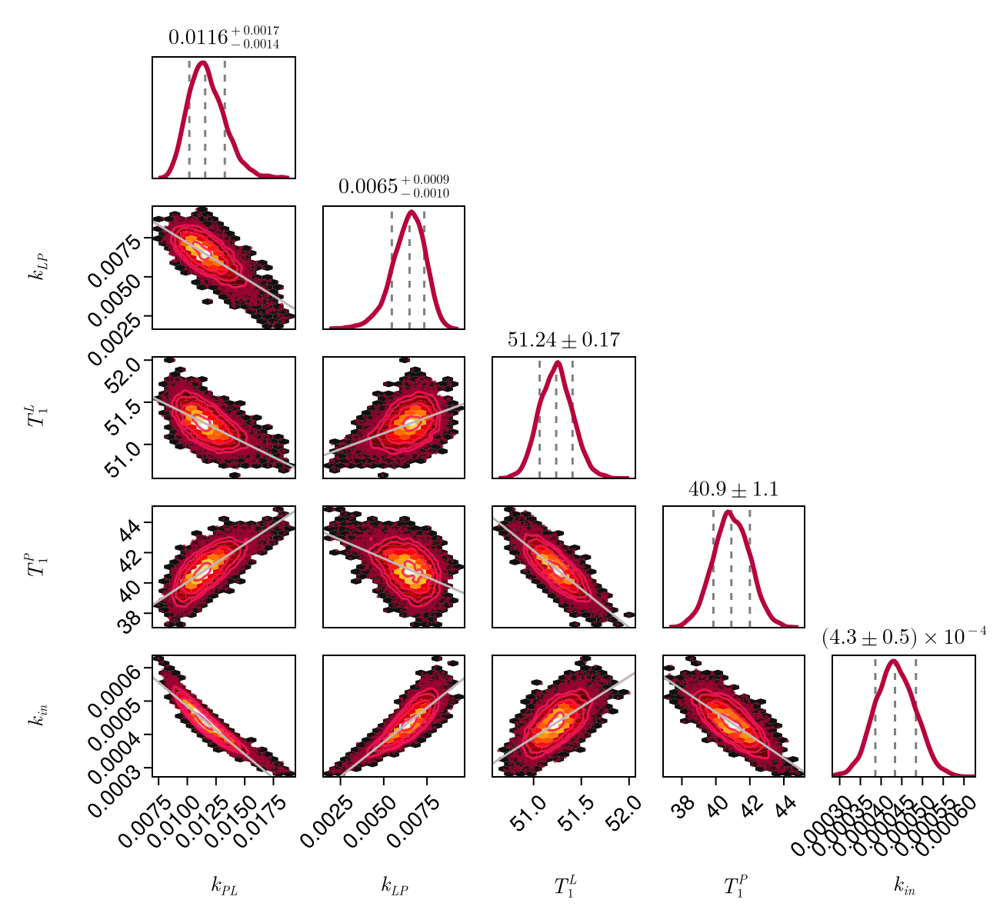

In [ ]:
label = [L"k_{PL}",L"k_{LP}",L"T_1^P",L"T_1^L", L"k_{in}"]
df = DataFrame(poster, :auto)


fig = Figure(size=(650,600))
# 
pairplot(fig[1,1], df => (
    PairPlots.HexBin(colormap=:linear_kryw_5_100_c67_n256, alpha=1), # RdYlGn
    PairPlots.Scatter(filtersigma=2, color="#9b0432ff", markersize=3, alpha=0.65),
    PairPlots.Contour(color="#fa145bff", alpha=0.85),
    # # New:
    
    PairPlots.MarginConfidenceLimits(),
    PairPlots.MarginDensity(color="#b7043bff", linewidth=3),
    PairPlots.TrendLine(color="#c0b5b9ff"), # default is red
    
), 
labels = Dict(:x1 => label[1],:x2 => label[2],:x3 => label[3],:x4 => label[4],:x5 => label[5]))

save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\PosteriorTransporterCorr_NEW.svg", fig)


fig

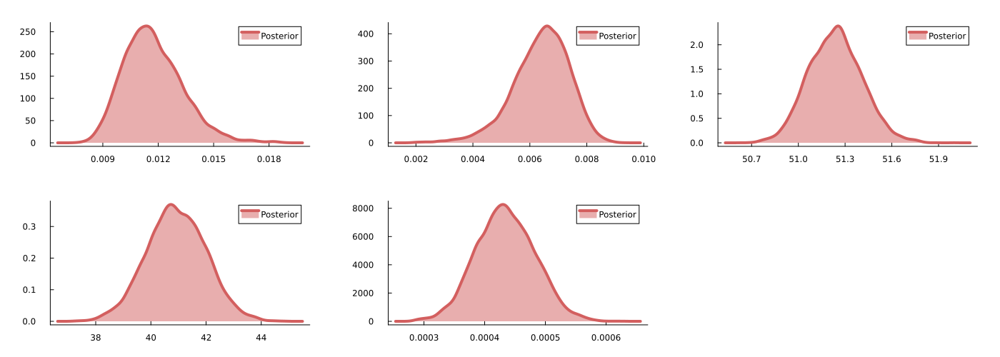

In [8]:
p1 = plot(kde(poster[:,1]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p2 = plot(kde(poster[:,2]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p3 = plot(kde(poster[:,3]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p4 = plot(kde(poster[:,4]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p5 = plot(kde(poster[:,5]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))


plot(p1,p2,p3,p4, p5, size = (1400,500), margin = 6mm, grid=false)

# savefig("PosteriorTest.svg")

plot(p1,p2,p3,p4, p5, size = (1400,500), margin = 6mm, grid=false)


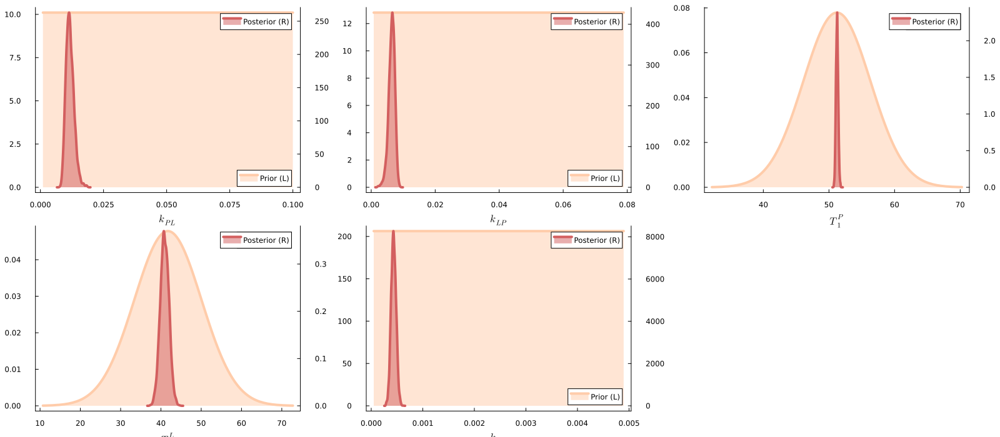

In [28]:
pp = [0.00999999999989405
0.00789216686370161
51.20933014343426
41.73351464475684
0.0004895619448586228];

p1 = plot(Uniform(0.0009999, 0.09999), label = "Prior (L)", xlabel = L"k_{PL}", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,1]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))
# plot!(twinx(), [pp[1], pp[1]],[0,maximum(kde(poster[:,1]).density)], linewidth=3)


p2 = plot(Uniform(0.000789, 0.0789), label = "Prior (L)", xlabel = L"k_{LP}", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,2]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))
# plot!(twinx(), [pp[2], pp[2]],[0,maximum(kde(poster[:,1]).density)], linewidth=3)

p3 = plot(Normal(51.21, 5.12), label = "Prior (L)", xlabel = L"T_1^P", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,3]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))
# plot!(twinx(), [pp[3], pp[3]],[0,maximum(kde(poster[:,1]).density)], linewidth=3)

p4 = plot(Normal(41.73, 8.34), label = "Prior (L)", xlabel = L"T_1^L", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,4]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))
# plot!(twinx(), [pp[4], pp[4]],[0,maximum(kde(poster[:,1]).density)], linewidth=3)

p5 = plot(Uniform(4.896e-5, .004896), label = "Prior (L)", xlabel = L"k_{IN}", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,5]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))
# plot!(twinx(), [pp[5], pp[5]],[0,maximum(kde(poster[:,1]).density)], linewidth=3)

plot(p1,p2,p3,p4,p5, size = (1600,700), margin = 10mm, grid=false)

# savefig("PosteriorTest.svg")

plot(p1,p2,p3,p4,p5, size = (1600,700), margin = 10mm, grid=false)


In [11]:
Ht = [entropy(Uniform(0.0009999, 0.09999)), entropy(Uniform(0.000789, 0.0789)), entropy(Normal(51.21, 5.12)), entropy(Normal(41.73, 8.34)), entropy(Uniform(4.896e-5, .004896))]

5-element Vector{Float64}:
 -2.3127354338478807
 -2.54962438698381
  3.052092972256089
  3.540001749575328
 -5.329387069625613

In [13]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\EntropyEstimationPosterior.jl")
H_U_Post1, H_Post1, H_L_Post1 = entroSing(poster[:,1:1]);
H_U_Post2, H_Post2, H_L_Post2 = entroSing(poster[:,2:2]);
H_U_Post3, H_Post3, H_L_Post3 = entroSing(poster[:,3:3]);
H_U_Post4, H_Post4, H_L_Post4 = entroSing(poster[:,4:4]);
H_U_Post5, H_Post5, H_L_Post5 = entroSing(poster[:,5:5]);

K-means converged with 2 iterations (objv = 0.002048271491259605)
K-means converged with 8 iterations (objv = 0.0017693571586331498)
K-means converged with 7 iterations (objv = 0.0017566875502831613)
K-means converged with 6 iterations (objv = 0.0015594032109230245)


┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 2 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 8 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 7 iterations
│ 500.0 data points per param

K-means converged with 8 iterations (objv = 0.0013149480400847092)
K-means converged with 7 iterations (objv = 0.0014666471750180558)
K-means converged with 20 iterations (objv = 0.0013038574114972701)


┌ Info: K-means with 3000 data points using 6 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 8 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 7 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data p

K-means converged with 11 iterations (objv = 0.0011720756928524545)
K-means converged with 14 iterations (objv = 0.001131496361761419)
K-means converged with 14 iterations (objv = 0.0010838961854184978)


┌ Info: K-means with 4000 data points using 20 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 11 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 14 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 dat

K-means converged with 16 iterations (objv = 0.0010115259031636997)
K-means converged with 10 iterations (objv = 0.0010055825509980593)
K-means converged with 18 iterations (objv = 0.0008156619538094435)


┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 16 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 10 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 18 iterations
│ 444.4 data points per pa

K-means converged with 31 iterations (objv = 0.000767850508062508)
K-means converged with 13 iterations (objv = 0.0007693770488189778)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 31 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 13 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 4 iterations (objv = 0.0006180992060807768)
K-means converged with 9 iterations (objv = 0.0005942415375272377)


┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 4 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 9 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 26 iterations (objv = 0.0005809381496694344)
K-means converged with 7 iterations (objv = 0.00046526466972083625)


┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 26 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 7 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 4 iterations (objv = 0.0004766954648525005)
K-means converged with 15 iterations (objv = 0.00045893833618874307)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 4 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 15 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 14 iterations (objv = 0.00037536995260767337)
K-means converged with 8 iterations (objv = 0.0003714161798249547)


┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 14 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 21 iterations (objv = 0.00036530168307225854)
K-means converged with 5 iterations (objv = 0.0003189875704111139)


┌ Info: K-means with 5333 data points using 8 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 21 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 5 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 10 iterations (objv = 0.00029404063976385113)
K-means converged with 16 iterations (objv = 0.0003188258083839794)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 10 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 16 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 29 iterations (objv = 0.0007008110918124545)
K-means converged with 4 iterations (objv = 3.47079224660754e-5)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 8000 data points using 29 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 32 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 4 iterations
│ 83.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 5 iterations (objv = 3.568089297240873e-5)


┌ Info: Initializing GMM, 32 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 5 iterations
│ 83.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 2 iterations (objv = 3.389529881773237e-5)


┌ Info: Initializing GMM, 32 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 2 iterations
│ 83.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 6 iterations (objv = 4.8408553250155244e-5)


┌ Info: Initializing GMM, 32 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 8000 data points using 6 iterations
│ 125.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


              Iteration 1 of 32
              Iteration 2 of 32
              Iteration 3 of 32
              Iteration 4 of 32
              Iteration 5 of 32
              Iteration 6 of 32
              Iteration 7 of 32
              Iteration 8 of 32
              Iteration 9 of 32
              Iteration 10 of 32
              Iteration 11 of 32
              Iteration 12 of 32
              Iteration 13 of 32
              Iteration 14 of 32
              Iteration 15 of 32
              Iteration 16 of 32
              Iteration 17 of 32
              Iteration 18 of 32
              Iteration 19 of 32
              Iteration 20 of 32
              Iteration 21 of 32
              Iteration 22 of 32
              Iteration 23 of 32
              Iteration 24 of 32
              Iteration 25 of 32
              Iteration 26 of 32
              Iteration 27 of 32
              Iteration 28 of 32
              Iteration 29 of 32
              Iteration 30 of 32
              Itera

┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 5 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 8 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 8 iterations
│ 500.0 data points per param

K-means converged with 7 iterations (objv = 0.0006052433178288666)
K-means converged with 14 iterations (objv = 0.0006342498853357664)
K-means converged with 11 iterations (objv = 0.0004909915154736816)


┌ Info: K-means with 3000 data points using 3 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 7 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 14 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data 

K-means converged with 12 iterations (objv = 0.00046913212856368816)
K-means converged with 7 iterations (objv = 0.0004704313944063907)
K-means converged with 7 iterations (objv = 0.00042267380602781896)


┌ Info: K-means with 4000 data points using 11 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 12 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 7 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data

K-means converged with 10 iterations (objv = 0.0004050977938853792)
K-means converged with 5 iterations (objv = 0.0004143536094764541)
K-means converged with 28 iterations (objv = 0.0003338043592960322)


┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 10 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 5 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 9 iterations (objv = 0.0003186711329099017)
K-means converged with 5 iterations (objv = 0.0003130036990288353)
K-means converged with 7 iterations (objv = 0.00024853739202371705)


┌ Info: K-means with 5333 data points using 28 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 9 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 5 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data 

K-means converged with 10 iterations (objv = 0.00024409674908505886)
K-means converged with 16 iterations (objv = 0.00025121698857206054)


┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 10 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 16 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 3 iterations (objv = 0.0001909406088385584)
K-means converged with 5 iterations (objv = 0.00018663501352703062)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 3 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 5 iterations (objv = 0.00019452172907581303)
K-means converged with 12 iterations (objv = 0.00015883439608556772)


┌ Info: K-means with 5333 data points using 5 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 5 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 12 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 14 iterations (objv = 0.00015980960302754903)
K-means converged with 3 iterations (objv = 0.0001513259424905684)


┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 14 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 3 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 10 iterations (objv = 0.00013126839401924066)
K-means converged with 6 iterations (objv = 0.00013219689247753418)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 10 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 6 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 5 iterations (objv = 0.00012404137307954797)
K-means converged with 13 iterations (objv = 0.0006110816202263831)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 5 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 7 iterations (objv = 9.569475041145542e-5)
K-means converged with 7 iterations (objv = 9.987977022602511e-5)


┌ Info: K-means with 3000 data points using 13 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 12 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 7 iterations
│ 222.2 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 12 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 9 iterations (objv = 9.56471145392205e-5)
K-means converged with 5 iterations (objv = 0.0001366911223172775)


┌ Info: K-means with 5333 data points using 7 iterations
│ 222.2 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 12 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 9 iterations
│ 222.2 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 12 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 8000 data points using 5 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


              Iteration 1 of 12
              Iteration 2 of 12
              Iteration 3 of 12
              Iteration 4 of 12
              Iteration 5 of 12
              Iteration 6 of 12
              Iteration 7 of 12
              Iteration 8 of 12
              Iteration 9 of 12
              Iteration 10 of 12
              Iteration 11 of 12
              Iteration 12 of 12
K-means converged with 10 iterations (objv = 21.23087820598994)
K-means converged with 11 iterations (objv = 19.895000519473797)
K-means converged with 20 iterations (objv = 21.7497656333735)
K-means converged with 11 iterations (objv = 17.688237375364224)


┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 10 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 11 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 20 iterations
│ 500.0 data points per pa

K-means converged with 14 iterations (objv = 16.635846237087208)
K-means converged with 25 iterations (objv = 15.82706006360695)
K-means converged with 46 iterations (objv = 14.411731362960381)
K-means converged with 37 iterations (objv = 14.154600178876535)

┌ Info: K-means with 3000 data points using 11 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 14 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 25 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 dat


K-means converged with 34 iterations (objv = 13.30577952074509)
K-means terminated without convergence after 50 iterations (objv = 12.103783402450063)


┌ Info: K-means with 4000 data points using 37 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 34 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means terminated without convergence after 50 iterations (objv = 11.834654914519888)
K-means converged with 37 iterations (objv = 11.059981282303852)
K-means converged with 10 iterations (objv = 9.29227095344595)


┌ Info: K-means with 5000 data points using 50 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 50 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 37 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 dat

K-means converged with 38 iterations (objv = 9.101225264347704)
K-means terminated without convergence after 50 iterations (objv = 8.831819794303556)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 38 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means terminated without convergence after 50 iterations (objv = 7.1814305919742765)
K-means converged with 42 iterations (objv = 6.83757340948614)


┌ Info: K-means with 5334 data points using 50 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 50 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means terminated without convergence after 50 iterations (objv = 6.631031189710484)
K-means converged with 41 iterations (objv = 5.620344074332934)


┌ Info: K-means with 5333 data points using 42 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 32 iterations (objv = 5.402614270124104)
K-means terminated without convergence after 50 iterations (objv = 5.766147356157489)


┌ Info: K-means with 5333 data points using 41 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 32 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means terminated without convergence after 50 iterations (objv = 4.445803990732202)
K-means converged with 19 iterations (objv = 4.274482675969011)


┌ Info: K-means with 5334 data points using 50 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 50 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means terminated without convergence after 50 iterations (objv = 4.222790591252306)
K-means terminated without convergence after 50 iterations (objv = 3.6746031063339615)


┌ Info: K-means with 5333 data points using 19 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means terminated without convergence after 50 iterations (objv = 3.4811697450140855)


┌ Info: K-means with 5333 data points using 50 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 19 iterations (objv = 3.426773481357486)
K-means converged with 23 iterations (objv = 14.433325537921519)


┌ Info: K-means with 5333 data points using 50 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 19 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 23 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means terminated without convergence after 50 iterations (objv = 14.329103340722213)
K-means converged with 27 iterations (objv = 13.408623732540946)
K-means converged with 34 iterations (objv = 13.682023524078431)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 50 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 27 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 34 iterations
│ 500.0 data points per pa

              Iteration 1 of 4
              Iteration 2 of 4
              Iteration 3 of 4
              Iteration 4 of 4
K-means converged with 9 iterations (objv = 858.7282555281417)
K-means converged with 14 iterations (objv = 801.0423142781578)
K-means converged with 9 iterations (objv = 772.6339201119054)
K-means converged with 28 iterations (objv = 679.7217498758391)


┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 9 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 14 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 9 iterations
│ 500.0 data points per para

K-means converged with 16 iterations (objv = 605.8553044110913)
K-means converged with 10 iterations (objv = 641.7268347553195)
K-means terminated without convergence after 50 iterations (objv = 568.4392481051468)
K-means terminated without convergence after 50 iterations (objv = 517.5432670082482)


┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 16 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 10 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 50 iterations
│ 500.0 data points per pa

K-means converged with 14 iterations (objv = 512.5681877972247)
K-means converged with 22 iterations (objv = 483.1765066559351)


┌ Info: K-means with 4000 data points using 50 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 14 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 22 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 dat

K-means terminated without convergence after 50 iterations (objv = 439.1171660761729)
K-means converged with 36 iterations (objv = 439.3729622879491)
K-means terminated without convergence after 50 iterations (objv = 365.26904640207795)


┌ Info: K-means with 5000 data points using 50 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 36 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 50 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 33 iterations (objv = 328.3583633761723)
K-means terminated without convergence after 50 iterations (objv = 345.4688179050245)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 33 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 37 iterations (objv = 274.14112890366187)
K-means converged with 38 iterations (objv = 248.7456069344712)


┌ Info: K-means with 5334 data points using 50 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 37 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 38 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 43 iterations (objv = 256.1883729429778)
K-means converged with 32 iterations (objv = 215.2590282610072)


┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 43 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 31 iterations (objv = 188.35007179710874)
K-means terminated without convergence after 50 iterations (objv = 203.3096646711465)


┌ Info: K-means with 5333 data points using 32 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 31 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 17 iterations (objv = 175.45162289288282)
K-means terminated without convergence after 50 iterations (objv = 152.5804280920065)


┌ Info: K-means with 5334 data points using 50 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 17 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means terminated without convergence after 50 iterations (objv = 168.41929928732543)
K-means terminated without convergence after 50 iterations (objv = 138.61293879245522)


┌ Info: K-means with 5333 data points using 50 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 44 iterations (objv = 126.07971694878006)
K-means converged with 21 iterations (objv = 134.94359632861142)


┌ Info: K-means with 5333 data points using 50 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 44 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 21 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 39 iterations (objv = 563.2176644485526)
K-means converged with 29 iterations (objv = 518.5877338398786)
K-means converged with 34 iterations (objv = 523.7517306563032)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 39 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 29 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 34 iterations
│ 500.0 data points per pa

K-means converged with 12 iterations (objv = 544.4520664660581)
              Iteration 1 of 4
              Iteration 2 of 4
              Iteration 3 of 4
              Iteration 4 of 4
K-means converged with 2 iterations (objv = 2.1393321932580755e-6)
K-means converged with 1 iterations (objv = 1.659410953460898e-6)
K-means converged with 1 iterations (objv = 1.8743988587826801e-6)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 12 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 2 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 1 iterations
│ 500.0 data points per para

K-means converged with 1 iterations (objv = 1.3631543385576743e-6)
K-means converged with 1 iterations (objv = 1.2324437784712468e-6)
K-means converged with 1 iterations (objv = 1.3881785210573846e-6)
K-means converged with 1 iterations (objv = 1.2206404227532034e-6)


┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 1.1726436116143614e-6)
K-means converged with 1 iterations (objv = 1.1301743405782828e-6)
K-means converged with 1 iterations (objv = 1.3105435707329417e-6)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 1.3221886723030563e-6)
K-means converged with 1 iterations (objv = 9.875072444777826e-7)
K-means converged with 1 iterations (objv = 8.266392938303951e-7)


┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 444.4 data points per param

K-means converged with 1 iterations (objv = 1.272114353446011e-6)
K-means converged with 1 iterations (objv = 7.555754852958963e-7)
K-means converged with 1 iterations (objv = 6.612314174210454e-7)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 380.9 data points per param

K-means converged with 1 iterations (objv = 6.456990983986416e-7)
K-means converged with 1 iterations (objv = 7.191989568025532e-7)


┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 5.636417053774887e-7)
K-means converged with 1 iterations (objv = 6.176329320396927e-7)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 5.195795675619742e-7)
K-means converged with 1 iterations (objv = 5.530128351240111e-7)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 3.6046091611112276e-7)
K-means converged with 1 iterations (objv = 4.711280736469946e-7)


┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 3.117415915094204e-7)
K-means converged with 1 iterations (objv = 3.0722992938863485e-7)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 3.777522658621832e-7)
K-means converged with 1 iterations (objv = 1.5676602004372425e-6)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 1.135169930852383e-6)
K-means converged with 1 iterations (objv = 1.4512315612022238e-6)
K-means converged with 1 iterations (objv = 1.3595545606639006e-6)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


              Iteration 1 of 4
              Iteration 2 of 4
              Iteration 3 of 4
              Iteration 4 of 4


┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


In [14]:
Htd = [H_Post1[1], H_Post2[1], H_Post3[1], H_Post4[1], H_Post5[1]]

5-element Vector{Float64}:
 -3.981561492824587
 -4.5032285612731275
  0.5242036528348809
  2.370112703480965
 -7.611644429218813

In [15]:
Ht - Htd

5-element Vector{Float64}:
 1.6688260589767063
 1.9536041742893175
 2.527889319421208
 1.1698890460943634
 2.282257359593199

# Simulate Posterior Prediction (Quantiles)

In [8]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")

PyruvateHP_NMR_SolveAllMM (generic function with 1 method)

In [9]:
dat2 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\2Mil_Dat.csv", DataFrame));
dat4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
dat8 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_Dat.csv", DataFrame));

dat = [dat2, dat4, dat8];

## Prior Prediction (Check)

In [10]:
Random.seed!(565874865134); 

kPL = rand(Uniform(0.0009999, 0.09999), 8000);
kLP = rand(Uniform(0.000789, 0.0789), 8000);
T1P = rand(Normal(51.21, 5.12), 8000);
T1L = rand(Normal(41.73, 8.34), 8000);
kIN = rand(Uniform(4.896e-5, .004896), 8000);

prior2 = hcat(kPL.*2, kLP.*2, T1P, T1L, kIN.*2, zeros(8000));
prior4 = hcat(kPL.*4, kLP.*4, T1P, T1L, kIN.*4, zeros(8000));
prior8 = hcat(kPL.*8, kLP.*8, T1P, T1L, kIN.*8, zeros(8000));

In [11]:
tsC2 = dat2[:,1]
ts = 0:tsC2[end];
ivss = [dat2[1,2],0, dat2[1,4]];
samps = convert.(Int, tsC2);
SimOnTime1prior, SimOffTime1prior, SimAll1prior  = PyruvateHP_NMR_SolveAllTb(ts, prior2, ivss, samps);

tsC4 = dat4[:,1]
ts = 0:tsC4[end];
ivss = [dat4[1,2],0, dat4[1,4]];
samps = convert.(Int, tsC4);
SimOnTime2prior, SimOffTime2prior, SimAll2prior  = PyruvateHP_NMR_SolveAllTb(ts, prior4, ivss, samps);

tsC8 = dat8[:,1]
ts = 0:tsC8[end];
ivss = [dat8[1,2],0, dat8[1,4]];
samps = convert.(Int, tsC8);
SimOnTime3prior, SimOffTime3prior, SimAll3prior  = PyruvateHP_NMR_SolveAllTb(ts, prior8, ivss, samps);

In [12]:
priorSims = [SimOnTime1prior, SimOnTime2prior, SimOnTime3prior];

In [13]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,3,3);

for k in 1:3
    for m in 1:3
        PriorQuant[1,k,m] = [percentile(priorSims[m][j,k,:], 99.5) for j in 1:size(priorSims[m][:,k,1])[1]]; # Up
        PriorQuant[2,k,m] = [percentile(priorSims[m][j,k,:], 0.5 ) for j in 1:size(priorSims[m][:,k,1])[1]]; # Down
    end
end


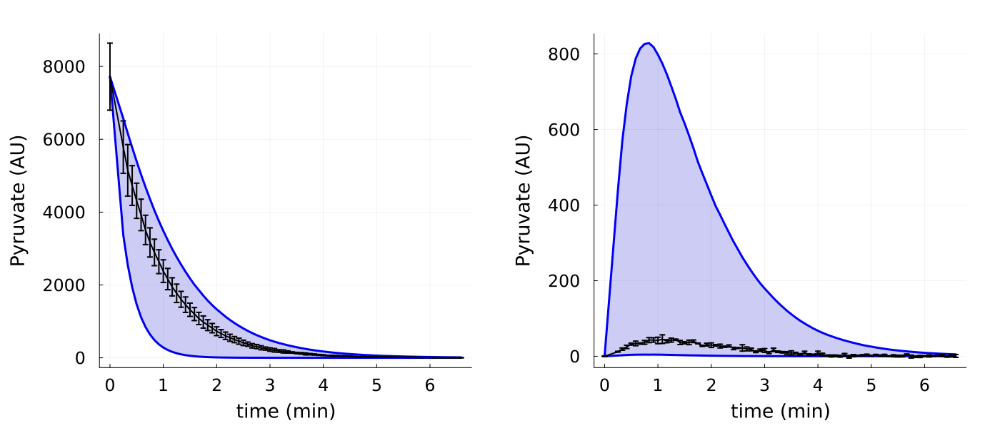

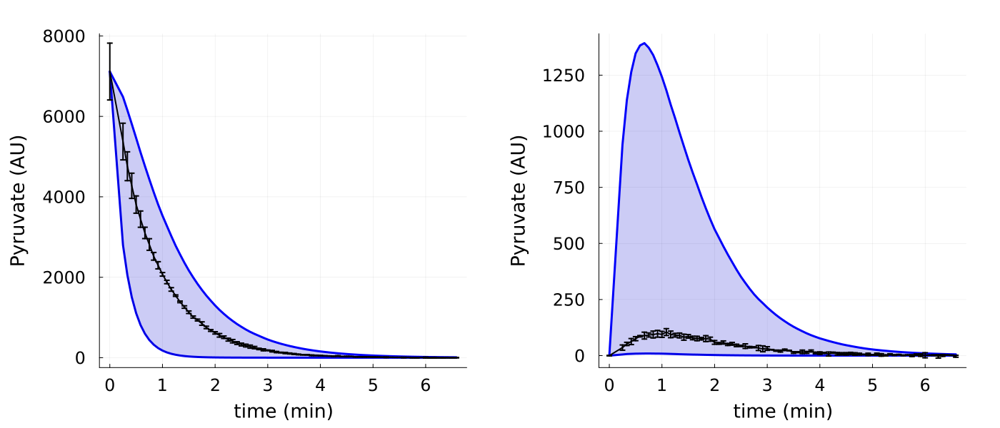

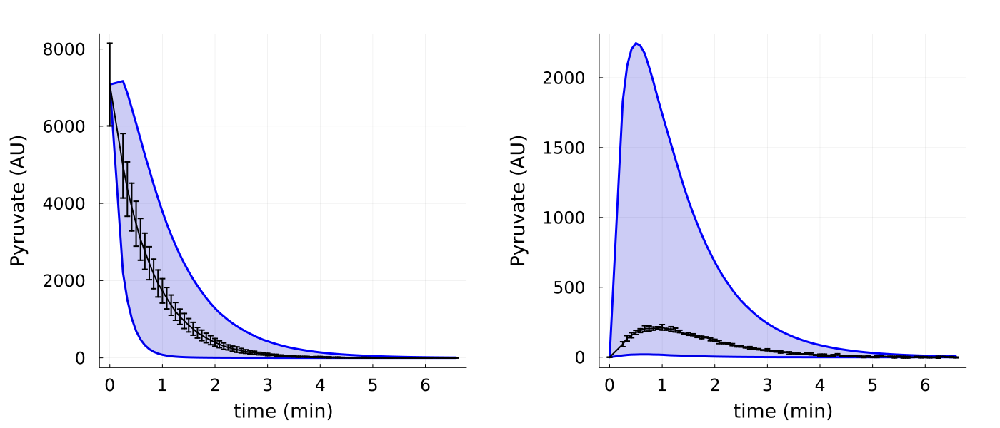

In [14]:
m = 1
for m in 1:3
  pr = plot(tsC2./60, PriorQuant[1,1,m]+PriorQuant[1,2,m], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2,1,m]+PriorQuant[2,2,m], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[2,1,m]+PriorQuant[2,2,m], fillrange=PriorQuant[1,1,m]+PriorQuant[1,2,m], label="", color="blue3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")

  po = plot(tsC2./60, PriorQuant[1,3,m], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2,3,m], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[2,3,m], fillrange=PriorQuant[1,3,m], label="", color="blue3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,4], yerror = dat[m][:,5], linewidth = 2, colour = "black", label = "")

  display(plot(pr, po, size = (1400, 600)))
end

## Posterior Prediction

In [15]:
tsC2 = dat2[:,1]
ts = 0:tsC2[end];
ivss = [dat2[1,2], 0, dat2[1,4]];
samps = convert.(Int, tsC2);
SimOnTime1poster, SimOffTime1poster, SimAll1poster  = PyruvateHP_NMR_SolveAllTb(ts, hcat(poster[:,1:2].*2, poster[:,4], poster[:,3], poster[:,end].*2, zeros(8000)), ivss, samps);

tsC4 = dat4[:,1]
ts = 0:tsC4[end];
ivss = [dat4[1,2], 0, dat4[1,4]];
samps = convert.(Int, tsC4);
SimOnTime2poster, SimOffTime2poster, SimAll2poster  = PyruvateHP_NMR_SolveAllTb(ts, hcat(poster[:,1:2].*4, poster[:,4], poster[:,3], poster[:,end].*4, zeros(8000)), ivss, samps);

tsC8 = dat8[:,1]
ts = 0:tsC8[end];
ivss = [dat8[1,2], 0, dat8[1,4]];
samps = convert.(Int, tsC8);
SimOnTime3poster, SimOffTime3poster, SimAll3poster  = PyruvateHP_NMR_SolveAllTb(ts, hcat(poster[:,1:2].*8, poster[:,4], poster[:,3], poster[:,end].*8, zeros(8000)), ivss, samps);

In [16]:
posterSims = [SimOnTime1poster, SimOnTime2poster, SimOnTime3poster];

In [17]:
# Dims = Up/Down, Observable, Experiment
PosterQuant = Array{Any}(undef,2,3,3);

for k in 1:3
    for m in 1:3
        PosterQuant[1,k,m] = [percentile(posterSims[m][j,k,:], 99.5) for j in 1:size(posterSims[m][:,k,1])[1]]; # Up
        PosterQuant[2,k,m] = [percentile(posterSims[m][j,k,:], 0.5 ) for j in 1:size(posterSims[m][:,k,1])[1]]; # Down
    end
end

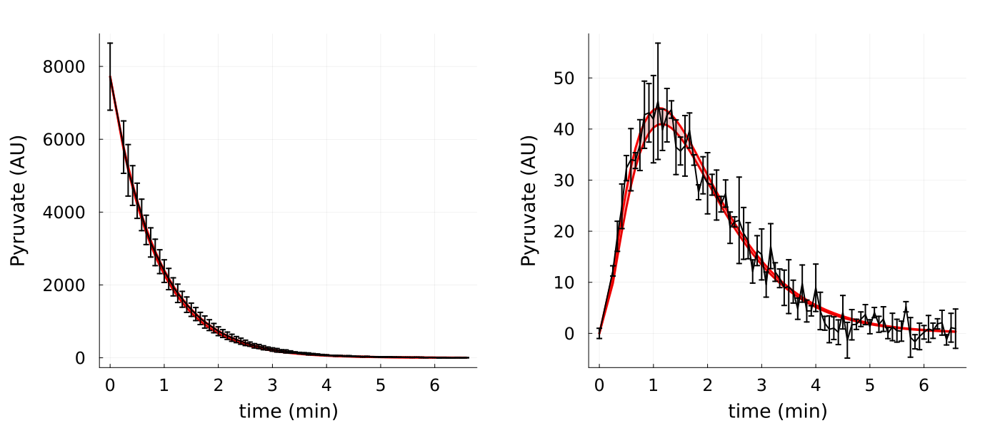

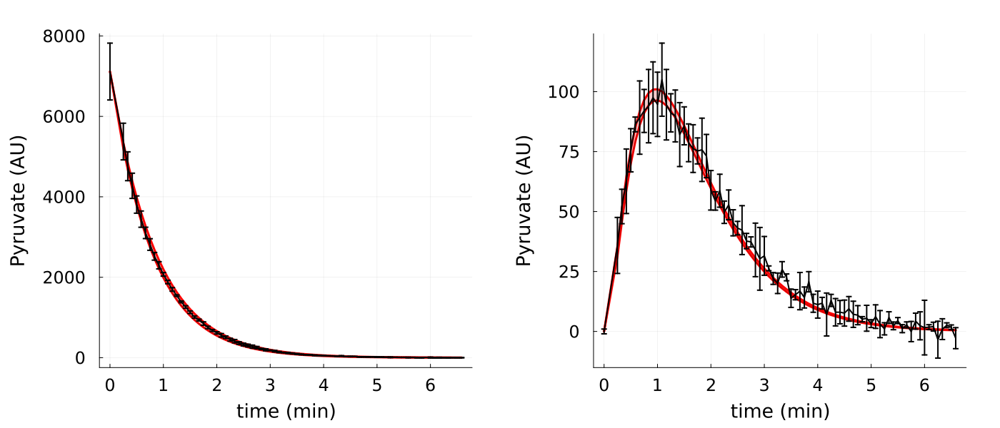

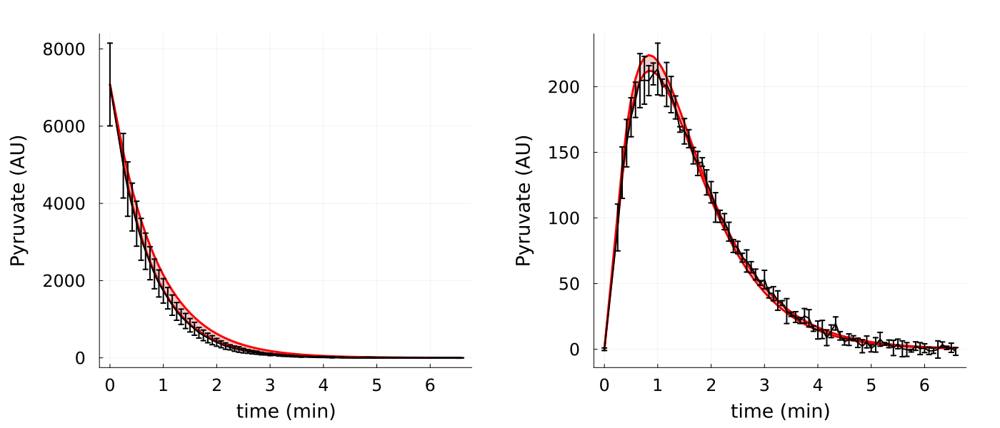

In [18]:
m=1
for m in 1:3
  pr = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "red", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="red3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")



  po = plot(tsC2./60, PosterQuant[1,3,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PosterQuant[2,3,m], label = "", color = "red", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,3,m], fillrange=PosterQuant[1,3,m], label="", color="red3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,4], yerror = dat[m][:,5], linewidth = 2, colour = "black", label = "")



  display(plot(pr, po, size = (1400, 600)))
end

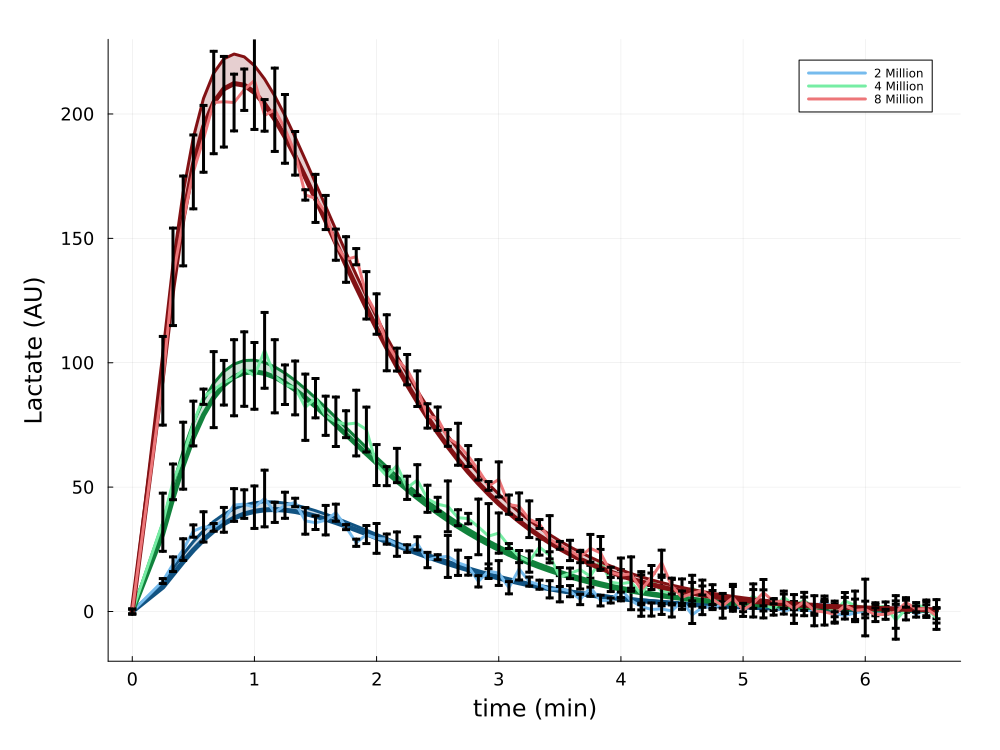

In [23]:
pp2 = plot(tsC2./60, PosterQuant[1,3,1], label = "", color = "#115382ff", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,3,1], label = "", color = "#115382ff", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,3,1], fillrange=PosterQuant[1,3,1], label="", color="#115382ff", fillalpha=0.2)
        plot!(tsC2./60, dat[1][:,4], yerror = dat[1][:,5], linewidth = 3, colour = "#76bbedff", label = "2 Million")


        plot!(tsC2./60, PosterQuant[1,3,2], label = "", color = "#11823cff", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,3,2], label = "", color = "#11823cff", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,3,2], fillrange=PosterQuant[1,3,2], label="", color="#11823cff", fillalpha=0.2)
        plot!(tsC2./60, dat[2][:,4], yerror = dat[2][:,5], linewidth = 3, colour = "#76eda4ff", label = "4 Million")

        plot!(tsC2./60, PosterQuant[1,3,3], label = "", color = "#821114ff", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,3,3], label = "", color = "#821114ff", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,3,3], fillrange=PosterQuant[1,3,3], label="", color="#821114ff", fillalpha=0.2)
        plot!(tsC2./60, dat[3][:,4], yerror = dat[3][:,5], linewidth = 3, colour = "#ed7679ff", label = "8 Million")

pFF = plot(pp2, size = (1000,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, ylim=(-20,230))


savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorPredictionLactateTransporter.svg")


display(pFF)

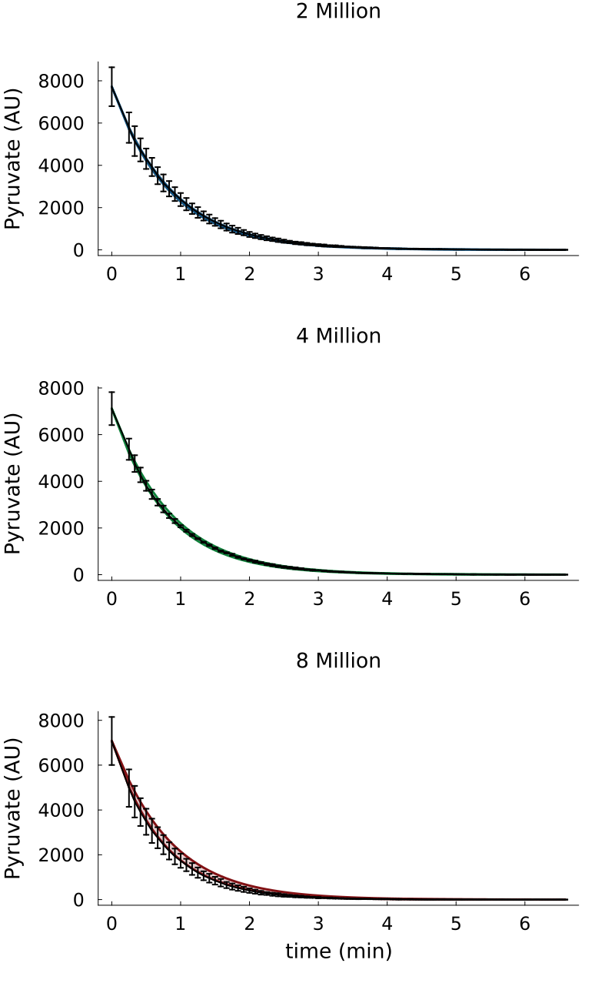

In [70]:

m=1
pr1 = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "#115382ff", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "", ylabel = "Pyruvate (AU)", grid = false, size = (1000,500), title = "2 Million")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "#115382ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="#115382ff", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")


  m=2
pr2 = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "#11823cff", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "", ylabel = "Pyruvate (AU)", grid = false, size = (1000,500), title = "4 Million")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "#11823cff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="#11823cff", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")


  m=3
pr3 = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "#821114ff", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)", grid = false, size = (1000,500), title = "8 Million")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "#821114ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")


PPR = plot(pr1,pr2,pr3, layout=(3,1), size = (800,1300))

savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SuppFig1Stuff\\PosteriorPredictionPyruvateTransporter.svg")

display(PPR)


#### No CO2 Comparison

In [37]:
C4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_Dat.csv", DataFrame));
L4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_NoCO2_Dat.csv", DataFrame));

In [100]:
tsC8 = dat8[:,1]
ts = 0:tsC8[end];
ivss = [dat8[1,2],0, dat8[1,4]];
samps = convert.(Int, tsC8);
SimOnTime3poster8, SimOffTime3poster8, SimAll3poster8 = PyruvateHP_NMR_SolveAllTb(ts, hcat(poster[1:700,1:2].*8, poster[1:700,4], poster[1:700,3], poster[1:700,end].*8, zeros(700)), ivss, samps);

SimOnTime3poster82, SimOffTime3poster82, SimAll3poster82 = PyruvateHP_NMR_SolveAllTb(ts, hcat(poster[1:700,1:2].*6, poster[1:700,4], poster[1:700,3], poster[1:700,end].*4, zeros(700)), ivss, samps);

posterSims8 = [SimOnTime3poster8, SimOnTime3poster82]

PosterQuant8 = Array{Any}(undef,2,3,length(posterSims8));
for k in 1:3
    for m in 1:length(posterSims8)
        PosterQuant8[1,k,m] = [percentile(posterSims8[m][j,k,:], 99.5) for j in 1:size(posterSims8[m][:,k,1])[1]]; # Up
        PosterQuant8[2,k,m] = [percentile(posterSims8[m][j,k,:], 0.5 ) for j in 1:size(posterSims8[m][:,k,1])[1]]; # Down
    end
end

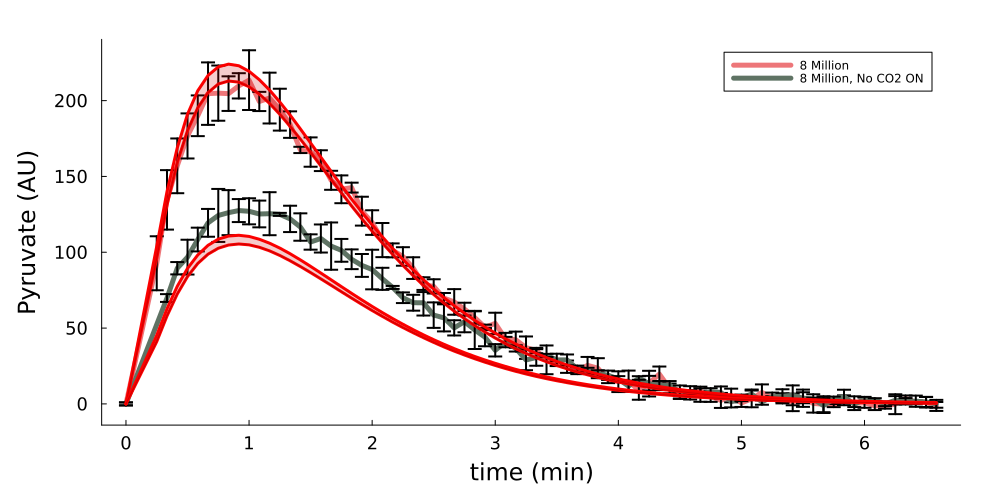

In [101]:
pp2 = plot(C4[:,1]./60, C4[:,4],  label = "8 Million", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=7, linewidth=5)
plot!(C4[:,1]./60, C4[:,4], yerror = C4[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=7, linewidth=2)
plot!((L4[:,1]) ./60, L4[:,4], label = "8 Million, No CO2 ON", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#5F7364", markersize=7, linewidth=5)
plot!((L4[:,1]) ./60, L4[:,4], yerror = L4[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#5F7364", markersize=7, linewidth=2)


m = 1
plot!(tsC2./60, PosterQuant8[1,3,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
plot!(tsC2./60, PosterQuant8[2,3,m], label = "", color = "red", linewidth = 3)
plot!(tsC2./60, PosterQuant8[2,3,m], fillrange=PosterQuant8[1,3,m], label="", color="red3", fillalpha=0.2)


m = 2
plot!(tsC2./60, PosterQuant8[1,3,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
plot!(tsC2./60, PosterQuant8[2,3,m], label = "", color = "red", linewidth = 3)
plot!(tsC2./60, PosterQuant8[2,3,m], fillrange=PosterQuant8[1,3,m], label="", color="red3", fillalpha=0.2)




pp=plot(pp2, size = (1000,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

## nRMSE 

In [20]:
nRMSE = zeros(3,8000);
nRMSE_pyr = zeros(3,8000);
nRMSE_lac = zeros(3,8000);

m = 1 # Experiment

k = 1; # Sample number
for m in 1:3
    for k in 1:8000

        pyrtmp = sqrt(sum((((posterSims[m][2:end,1,k].+posterSims[m][2:end,2,k]).-dat[m][2:end,2]).^2)./dat[m][2:end,3].^2)/length(dat[m][2:end,2]));
        lactmp = sqrt(sum(((posterSims[m][2:end,3,k].-dat[m][2:end,4]).^2)./dat[m][2:end,5].^2)/length(dat[m][2:end,4]));
        msetmp = (pyrtmp + lactmp)/2;

        nRMSE[m,k] = msetmp + log(4*log(2*77));
        nRMSE_pyr[m,k] = pyrtmp + log(4*log(2*77));
        nRMSE_lac[m,k] = lactmp + log(4*log(2*77));

    end
end

println("nRMSE total: "*string(sum(sum(nRMSE, dims=2)/8000)))
println("nRMSE pyruvate: "*string(sum(sum(nRMSE_pyr, dims=2)/8000)))
println("nRMSE lactate: "*string(sum(sum(nRMSE_lac, dims=2)/8000)))

nRMSE total: 12.439353675227304
nRMSE pyruvate: 12.727278568762486
nRMSE lactate: 12.1514287816921


In [15]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSETransp.jld", "nRMSE", nRMSE, "nRMSE_pyr", nRMSE_pyr, "nRMSE_lac", nRMSE_lac)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSETransp.csv", DataFrame(nRMSE, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSETransp.csv"

## BIC 

In [21]:
BIC = zeros(3,8000);
BIC_pyr = zeros(3,8000);
BIC_lac = zeros(3,8000);

m = 1 # Experiment
k = 1; # Sample number
for m in 1:3
    for k in 1:8000

        BIC[m,k] = sum(((posterSims[m][2:end,1,k].-dat[m][2:end,2]).^2)./dat[m][2:end,3].^2) + sum(((posterSims[m][2:end,3,k].-dat[m][2:end,4]).^2)./dat[m][2:end,5].^2) + (4*log(2*length(posterSims[m][2:end,1,k])));
        BIC_pyr[m,k] = sum((((posterSims[m][2:end,1,k]+posterSims[m][2:end,2,k]).-dat[m][2:end,2]).^2)./dat[m][2:end,3].^2) + (4*log(length(posterSims[m][2:end,1,k])));
        BIC_lac[m,k] = sum(((posterSims[m][2:end,3,k].-dat[m][2:end,4]).^2)./dat[m][2:end,5].^2) + (4*log(length(posterSims[m][2:end,1,k])));;

    end
end

println("BIC total: "*string(sum(sum(BIC, dims=2)/8000)))
println("BIC pyruvate: "*string(sum(sum(BIC_pyr, dims=2)/8000)))
println("BIC lactate: "*string(sum(sum(BIC_lac, dims=2)/8000)))

BIC total: 822.0973063831626
BIC pyruvate: 451.36960958043267
BIC lactate: 306.5931557735329


In [17]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICTransp.jld", "BIC", BIC, "BIC_pyr", BIC_pyr, "BIC_lac", BIC_lac)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICTransp.csv", DataFrame(BIC, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICTransp.csv"

## Bar plots of errors

In [22]:
nRMSENoT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSENoTransp.jld")["nRMSE"];

BICNoT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICNoTransp.jld")["BIC"];

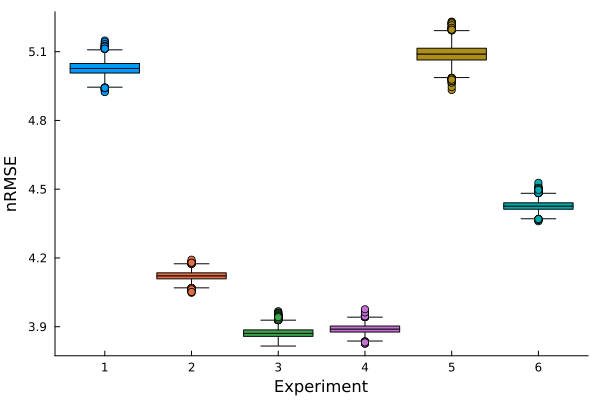

In [55]:
pps = boxplot([[nRMSENoT[1,:], nRMSE[1,:]], [nRMSENoT[2,:], nRMSE[2,:]], [nRMSENoT[3,:], nRMSE[3,:]]], label = "", grid = false, xlabel = "Experiment", ylabel = "nRMSE")

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\nRMSEModelsBoxPlot.svg")

display(pps)

In [23]:
nRMSENoT_pyr = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSENoTransp.jld")["nRMSE_pyr"];
nRMSENoT_lac = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSENoTransp.jld")["nRMSE_lac"];

BICNoT_pyr = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICNoTransp.jld")["BIC_pyr"];
BICNoT_lac = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICNoTransp.jld")["BIC_lac"];

In [30]:
mean(BIC_pyr, dims = 2)

3×1 Matrix{Float64}:
 113.3294450915814
  63.81522213552875
 274.22494235332255

In [31]:
mean(BICNoT_pyr, dims = 2)

3×1 Matrix{Float64}:
 151.21791279970031
  71.85723273074291
 379.3009470943655

In [32]:
va1 = vcat(nRMSENoT_pyr[1,:], nRMSE_pyr[1,:], nRMSENoT_pyr[2,:], nRMSE_pyr[2,:], nRMSENoT_pyr[3,:], nRMSE_pyr[3,:]);
va2 = vcat(nRMSENoT_lac[1,:], nRMSE_lac[1,:], nRMSENoT_lac[2,:], nRMSE_lac[2,:], nRMSENoT_lac[3,:], nRMSE_lac[3,:]);

va1b = vcat(BICNoT_pyr[1,:], BIC_pyr[1,:], BICNoT_pyr[2,:], BIC_pyr[2,:], BICNoT_pyr[3,:], BIC_pyr[3,:]);
va2b = vcat(BICNoT_lac[1,:], BIC_lac[1,:], BICNoT_lac[2,:], BIC_lac[2,:], BICNoT_lac[3,:], BIC_lac[3,:]);

xa = String[]
for i in 1:8000*2
    push!(xa,"2 Million")
end
for i in 1:8000*2
    push!(xa,"4 Million")
end
for i in 1:8000*2
    push!(xa,"8 Million")
end

t = String[]
for i in 1:8000
    push!(t,"No Transporter")
end
for i in 1:8000
    push!(t,"Transporter")
end

ca = vcat(t,t,t);

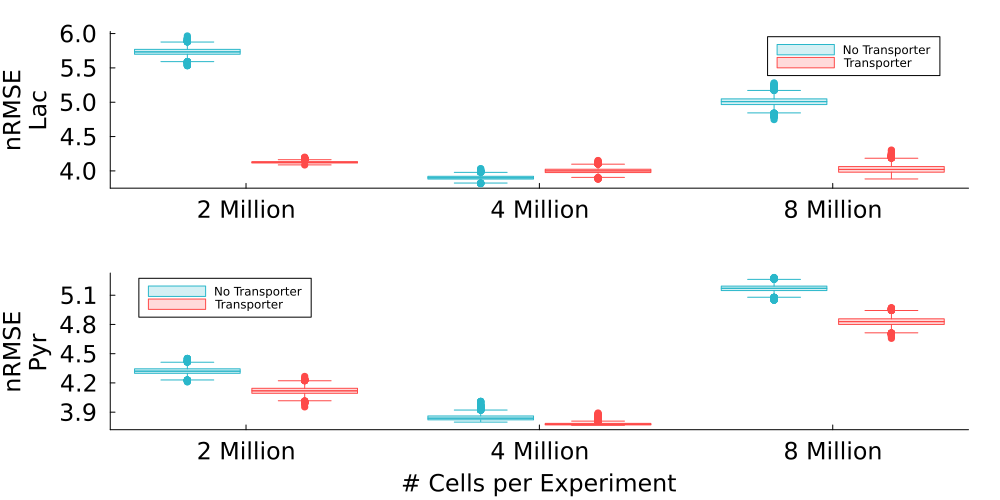

In [47]:
pps1 = groupedboxplot(xa, va1, group = ca, bar_width = 0.8, 
        grid = false, xlabel = "# Cells per Experiment", ylabel = "nRMSE\nPyr", 
        colour = ["#2ab7caff" "#fe4a49ff"], markerstrokecolour = ["#2ab7caff" "#fe4a49ff"], linecolour = ["#2ab7caff" "#fe4a49ff"], fillalpha = 0.2)
pps2 = groupedboxplot(xa, va2, group = ca, bar_width = 0.8, 
        grid = false, xlabel = "", ylabel = "nRMSE\nLac", 
        colour = ["#2ab7caff" "#fe4a49ff"], markerstrokecolour = ["#2ab7caff" "#fe4a49ff"], linecolour = ["#2ab7caff" "#fe4a49ff"], fillalpha = 0.2)
# colour = ["#f8d068ff" "#f86868ff"]

PPS = plot(pps2, pps1, layout=(2,1), size = (1000,500), margin = 6mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=16)
savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\nRMSEModelsBoxPlot.svg")
display(PPS)

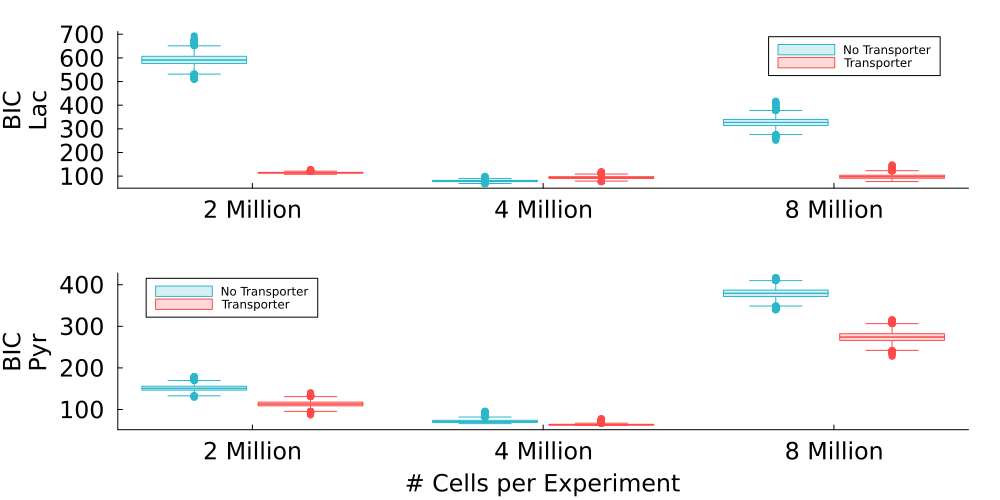

In [45]:
pps1 = groupedboxplot(xa, va1b, group = ca, bar_width = 0.8, 
        grid = false, xlabel = "# Cells per Experiment", ylabel = "BIC\nPyr", 
        colour = ["#2ab7caff" "#fe4a49ff"], markerstrokecolour = ["#2ab7caff" "#fe4a49ff"], linecolour = ["#2ab7caff" "#fe4a49ff"], fillalpha = 0.2)
pps2 = groupedboxplot(xa, va2b, group = ca, bar_width = 0.8, 
        grid = false, xlabel = "", ylabel = "BIC\nLac", 
        colour = ["#2ab7caff" "#fe4a49ff"], markerstrokecolour = ["#2ab7caff" "#fe4a49ff"], linecolour = ["#2ab7caff" "#fe4a49ff"], fillalpha = 0.2)
# colour = ["#004280ff" "#ADEFD1FF"]

PPS = plot(pps2, pps1, layout=(2,1), size = (1000,500), margin = 6mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=16)
savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\BICModelsBoxPlot.svg")
display(PPS)

In [72]:
nRMSENoT_pyr[1,:]

8000-element Vector{Float64}:
 4.268491866147801
 4.267769611287356
 4.25935058523828
 4.261449262983724
 4.258571202411392
 4.257576463658475
 4.259681380445536
 4.259233585461303
 4.259233585461303
 4.260633278162616
 ⋮
 4.311924773520627
 4.309236954693442
 4.313306931611071
 4.331516187449306
 4.339148500170831
 4.335562866303906
 4.328382426355857
 4.332128249454707
 4.331748584026853

In [71]:
[nRMSENoT_pyr[1,:], nRMSE_pyr[1,:]], [nRMSENoT_pyr[2,:], nRMSE_pyr[2,:]], [nRMSENoT_pyr[3,:], nRMSE_pyr[3,:]]

([[4.268491866147801, 4.267769611287356, 4.25935058523828, 4.261449262983724, 4.258571202411392, 4.257576463658475, 4.259681380445536, 4.259233585461303, 4.259233585461303, 4.260633278162616  …  4.319504555446733, 4.311924773520627, 4.309236954693442, 4.313306931611071, 4.331516187449306, 4.339148500170831, 4.335562866303906, 4.328382426355857, 4.332128249454707, 4.331748584026853], [4.05852947634518, 4.077078254889352, 4.064427450755191, 4.079501491964559, 4.143489635143842, 4.160009409535791, 4.176865449896749, 4.1022102313295346, 4.147663814743295, 4.090895815447364  …  4.124892794448957, 4.123247731142352, 4.128240443554654, 4.0911903165634484, 4.139712952685799, 4.124198432310306, 4.212878895754715, 4.067832411785563, 4.066528546789657, 4.074448669931543]], [[3.8050966719558104, 3.804736688569293, 3.80212655936825, 3.8028116804588956, 3.8019922685804817, 3.8017187786631528, 3.802329126863922, 3.8021652733244604, 3.8021652733244604, 3.8024941387018267  …  3.8424110037368457, 3.8357

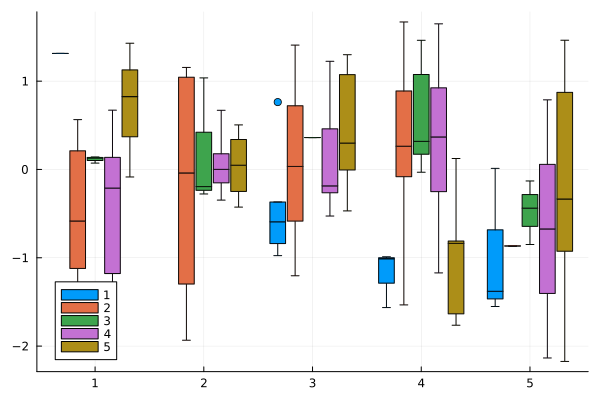

In [1]:
# a = rand(1:5, 100)
# b = rand(1:5, 100)
# c = randn(100)
# using StatsPlots
# groupedboxplot(a, c, group = b, bar_width = 0.8)